# PK/PD AL Model
# Date: 07/08/2025

## Checking model status, creating graphs for model validation and sensitivity analysis

<br>

In [4]:
import subprocess
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolacors
import pickle
from tqdm import tqdm  # For progress bar
from multiprocessing import Pool, cpu_count
import os
import sys
import time
import datetime 
from math import *

<br>

# ```pmax_artemether``` = 0.9998653531 and ```ec50_lum``` values for 4 genotypes

## AL maximum efficacy: 96.5%, 72.7892066535
## pfcrt K76: 92.5%, 121.5372211838
## pfcrt 76T: 91.9%, 129.4004601323
## pfmdr1 N86: 87.5%, 195.0108555496
## pfmdr1 86Y: 100%, 1.0000000000

<br>

<br>

---

## pfmdr1 86Y: 100%
### ```pmax_artemether```: 0.9998653531
### ```ec50_lum```: 1

In [2]:
# Function to run a single simulation for a given weight value

def run_single_weight_simulation(weight):
    start_time = time.monotonic()
    command_weight = [
        "/home/venitha_b/Projects/2019-test-ppq-pk/build/run_ppq_pk",
        "--AL",
        "-n", "5000",
        "--pmax_artemether", "0.9998653531",
        "--ec50_lum", "1",
        "--weight", str(weight)
    ]

    try:
        # Run the command and capture output
        output_weight = subprocess.run(command_weight, capture_output=True, text=True, check=True)

        # Process the output
        lines_weight = output_weight.stdout.splitlines()
        df_weight = pd.DataFrame([line.split() for line in lines_weight], columns=["PID", "HOUR", "COMP2CONC_ARTEMETHER", "COMP2CONC_LUM", "PARASITEDENSITY"])
        
        # Clean the DataFrame
        df_weight = df_weight.iloc[1:].apply(pd.to_numeric, errors='coerce')

        # Calculate the efficacy
        if df_weight['PARASITEDENSITY'].isna().any():
            failed_treatment_count = np.nan
        else:
            failed_treatment_count = df_weight[(df_weight['PARASITEDENSITY'] >= 10) & (df_weight['HOUR'] == 671.0)].shape[0]
        
        total_patients = df_weight['PID'].nunique()
        
        if total_patients == 0 or np.isnan(failed_treatment_count): 
            efficacy = np.nan
        else:
            percentage_failed = (failed_treatment_count / total_patients) * 100
            efficacy = (100 - percentage_failed)
            if np.isnan(efficacy):
                efficacy = np.nan
        
        end_time = time.monotonic()
        today = datetime.date.today()
        print("\nToday's date: ", today, "\n")
        print("Length of simulation: ", datetime.timedelta(seconds=end_time - start_time), "\n")

        return efficacy, df_weight, failed_treatment_count
        
    except subprocess.CalledProcessError as e:
        print(f"Error in subprocess for weight: {weight}: {e}")
        return np.nan, None, 0  # Return NaN, None, and 0 in case of failure
    except Exception as e:
        print(f"An unexpected error occurred for weight: {weight}: {e}")
        return np.nan, None, 0  # Return NaN, None, and 0 in case of failure

In [3]:
# Define the weight values to use
#weight_values = [5, 10, 15, 20, 30, 40, 50, 60, 70]
weight_values = [54]

# File suffix for saving results
file_suffix = "AL_pfmdr186Y"

for weight in weight_values:

        efficacy, df_weight, failed_treatment_count = run_single_weight_simulation(weight)
        
        # Save the DataFrame to a pickle file
        df_weight.to_pickle(f"df_weight_{weight}kg_{file_suffix}.pyobj")

        # Save the DataFrame to a CSV file
        df_weight.to_csv(f"df_weight_{weight}kg_{file_suffix}.csv", index=False)

        print(f"\nThe failed treatment count for weight {weight}kg is:", failed_treatment_count)
        print(f"\nThe percentage efficacy for weight {weight}kg is:", efficacy, "\n")



Today's date:  2025-07-09 

Length of simulation:  0:02:04.594324 


The failed treatment count for weight 54kg is: 0

The percentage efficacy for weight 54kg is: 100.0 



In [5]:
# Load the dataframes
# Calculate the efficacy for each weight group

failed_treatment_count = []
efficacy = []
df_weight_compiled = []

for weight in [54]:
    # Load the dataframe
    df_weight = pd.read_pickle(f"df_weight_{weight}kg_{file_suffix}.pyobj")
    # Calculate the efficacy
    failed_treatment_count.append(df_weight[(df_weight['PARASITEDENSITY'] >= 10) & (df_weight['HOUR'] == 671.0)].shape[0])
    total_patients = df_weight['PID'].nunique()
    efficacy.append((1 - (failed_treatment_count[-1] / total_patients)) * 100 if total_patients > 0 else np.nan)
    # Append the dataframe to the list
    df_weight_compiled.append(df_weight)
# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Weight': [54],
    'Failed Treatment Count': failed_treatment_count,
    'Efficacy': efficacy
})

# Save the results to a CSV file
results_df.to_csv(f"efficacy_results_compiled_{file_suffix}.csv", index=False)
# Save the results to a pickle file
results_df.to_pickle(f"efficacy_results_compiled_{file_suffix}.pyobj")
# Print the results
print("\nEfficacy Results:")
print(results_df)
 


Efficacy Results:
   Weight  Failed Treatment Count  Efficacy
0      54                       0     100.0


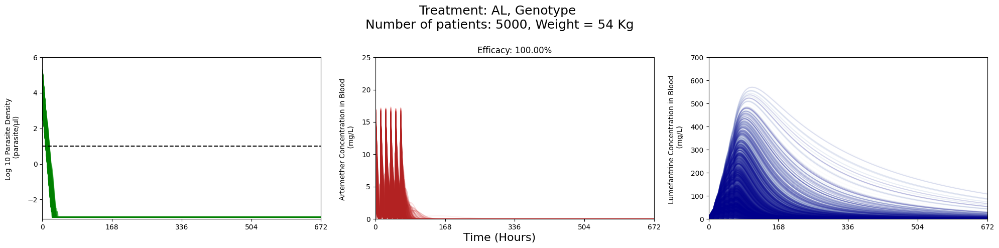

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

df_dict = {54: df_weight_compiled[0]}

fig, ax = plt.subplots(1, 3, figsize=(20, 5), sharex=True)  # 3 rows, 1 column

# Define colormaps for each plot
green_cmap = LinearSegmentedColormap.from_list("green_cmap", ["white", "lightgreen", "green"])
red_cmap = LinearSegmentedColormap.from_list("red_cmap", ["white", "lightcoral", "firebrick"])
blue_cmap = LinearSegmentedColormap.from_list("blue_cmap", ["white", "lightsteelblue", "darkblue"])

weight = 54
df_weight = df_dict[weight]
num_pids = len(df_weight['PID'].unique())
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)

# Log10 Parasite Density
for j, pid in enumerate(df_weight['PID'].unique()):
    df_pid = df_weight[df_weight['PID'] == pid].copy()
    df_pid['LOG10_PARASITEDENSITY'] = np.log10(df_pid['PARASITEDENSITY'] + 0.001)
    color = green_cmap(norm(j))
    ax[0].plot(df_pid['HOUR'], df_pid['LOG10_PARASITEDENSITY'], color=color, alpha=0.25)
ax[0].set_ylim(-3.1, 6)
ax[0].axhline(y=np.log10(10), color='black', linestyle='--')

# Artemether Concentration
for j, pid in enumerate(df_weight['PID'].unique()):
    df_pid = df_weight[df_weight['PID'] == pid]
    color = red_cmap(norm(j))
    ax[1].plot(df_pid['HOUR'], df_pid['COMP2CONC_ARTEMETHER'], color=color, alpha=0.25)
ax[1].set_ylim(0, 25)
ax[1].set_yticks(range(0, 30, 5))

# Lumefantrine Concentration
for j, pid in enumerate(df_weight['PID'].unique()):
    df_pid = df_weight[df_weight['PID'] == pid]
    color = blue_cmap(norm(j))
    ax[2].plot(df_pid['HOUR'], df_pid['COMP2CONC_LUM'], color=color, alpha=0.25)
ax[2].set_ylim(0, 700)
ax[2].set_yticks(range(0, 800, 100))

# Set x-axis limits and ticks
for a in ax:
    a.set_xlim(0, 672)
    a.set_xticks(range(0, 673, 168))

# Set titles and labels
ax[1].set_title(f'Efficacy: {results_df[results_df["Weight"] == weight]["Efficacy"].values[0]:.2f}%')
row_titles = [
    "Log 10 Parasite Density \n (parasite/μl)",
    "Artemether Concentration in Blood \n (mg/L)",
    "Lumefantrine Concentration in Blood \n (mg/L)"
]
for i, a in enumerate(ax):
    a.set_ylabel(row_titles[i], fontsize=10, rotation=90, labelpad=10)

fig.text(0.5, 0.04, 'Time (Hours)', ha='center', fontsize=16)
#fig.suptitle(f"Treatment: AL, Genotype: TYY--C1 and TYY--C2\nNumber of patients: {num_pids} for each Weight Group", fontsize=18)
fig.suptitle(f"Treatment: AL, Genotype \nNumber of patients: {num_pids}, Weight = 54 Kg", fontsize=18)
plt.tight_layout(rect=[0, 0.05, 1, 0.98])
plt.savefig(f"df_weight_efficacy_{file_suffix}.png")
plt.show()

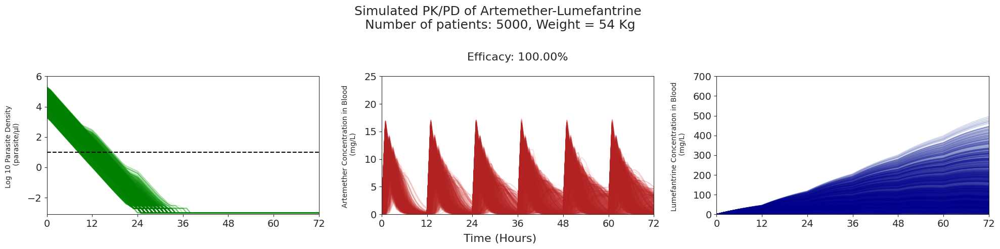

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

df_dict = {54: df_weight_compiled[0]}

fig, ax = plt.subplots(1, 3, figsize=(20, 5), sharex=True)  # 3 rows, 1 column

# Define colormaps for each plot
green_cmap = LinearSegmentedColormap.from_list("green_cmap", ["white", "lightgreen", "green"])
red_cmap = LinearSegmentedColormap.from_list("red_cmap", ["white", "lightcoral", "firebrick"])
blue_cmap = LinearSegmentedColormap.from_list("blue_cmap", ["white", "lightsteelblue", "darkblue"])

weight = 54
df_weight = df_dict[weight]
num_pids = len(df_weight['PID'].unique())
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)

# Log10 Parasite Density
for j, pid in enumerate(df_weight['PID'].unique()):
    df_pid = df_weight[df_weight['PID'] == pid].copy()
    df_pid['LOG10_PARASITEDENSITY'] = np.log10(df_pid['PARASITEDENSITY'] + 0.001)
    color = green_cmap(norm(j))
    ax[0].plot(df_pid['HOUR'], df_pid['LOG10_PARASITEDENSITY'], color=color, alpha=0.25)
ax[0].set_ylim(-3.1, 6)
ax[0].axhline(y=np.log10(10), color='black', linestyle='--')

# Artemether Concentration
for j, pid in enumerate(df_weight['PID'].unique()):
    df_pid = df_weight[df_weight['PID'] == pid]
    color = red_cmap(norm(j))
    ax[1].plot(df_pid['HOUR'], df_pid['COMP2CONC_ARTEMETHER'], color=color, alpha=0.25)
ax[1].set_ylim(0, 25)
ax[1].set_yticks(range(0, 30, 5))

# Lumefantrine Concentration
for j, pid in enumerate(df_weight['PID'].unique()):
    df_pid = df_weight[df_weight['PID'] == pid]
    color = blue_cmap(norm(j))
    ax[2].plot(df_pid['HOUR'], df_pid['COMP2CONC_LUM'], color=color, alpha=0.25)
ax[2].set_ylim(0, 700)
ax[2].set_yticks(range(0, 800, 100))

# Set x-axis limits and ticks
for a in ax:
    a.set_xlim(0, 72)
    a.set_xticks(range(0, 73, 12))

# Set titles and labels
ax[1].set_title(f'Efficacy: {results_df[results_df["Weight"] == weight]["Efficacy"].values[0]:.2f}%\n', fontsize=16)
row_titles = [
    "Log 10 Parasite Density \n (parasite/μl)",
    "Artemether Concentration in Blood \n (mg/L)",
    "Lumefantrine Concentration in Blood \n (mg/L)"
]
for i, a in enumerate(ax):
    a.set_ylabel(row_titles[i], fontsize=10, rotation=90, labelpad=10)

fig.text(0.5, 0.04, 'Time (Hours)', ha='center', fontsize=16)
#fig.suptitle(f"Treatment: AL, Genotype: TYY--C1 and TYY--C2\nNumber of patients: {num_pids} for each Weight Group", fontsize=18)
fig.suptitle(f"Simulated PK/PD of Artemether-Lumefantrine \nNumber of patients: {num_pids}, Weight = 54 Kg", fontsize=18)
plt.tight_layout(rect=[0, 0.05, 1, 0.98])
plt.savefig(f"df_weight_efficacy_{file_suffix}_72h.png")
plt.show()

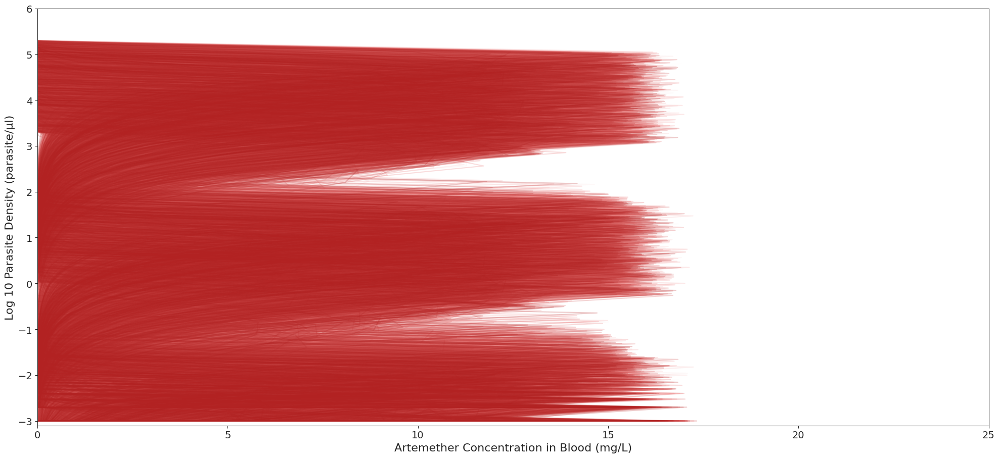

In [66]:
df_dict = {54: df_weight_compiled[0]}

fig, ax = plt.subplots(figsize=(20, 10), sharex=True) 

red_cmap = LinearSegmentedColormap.from_list("red_cmap", ["white", "lightcoral", "firebrick"])

weight = 54
df_weight = df_dict[weight]
num_pids = len(df_weight['PID'].unique())
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)

# Artemether Concentration
for j, pid in enumerate(df_weight['PID'].unique()):
    df_pid = df_weight[df_weight['PID'] == pid].copy()
    df_pid['LOG10_PARASITEDENSITY'] = np.log10(df_pid['PARASITEDENSITY'] + 0.001)
    color = red_cmap(norm(j))
    ax.plot(df_pid['COMP2CONC_ARTEMETHER'],df_pid['LOG10_PARASITEDENSITY'], color=color, alpha=0.25)
ax.set_xlim(0, 25)
ax.set_xticks(range(0, 30, 5))
ax.set_ylim(-3.1, 6)
ax.set_yticks(range(-3, 7, 1))
ax.set_xlabel('Artemether Concentration in Blood (mg/L)', fontsize=16)
ax.set_ylabel('Log 10 Parasite Density (parasite/μl)', fontsize=16)


plt.tight_layout(rect=[0, 0.05, 1, 0.98])
#plt.savefig(f"df_weight_efficacy_{file_suffix}_72h.png")
plt.show()

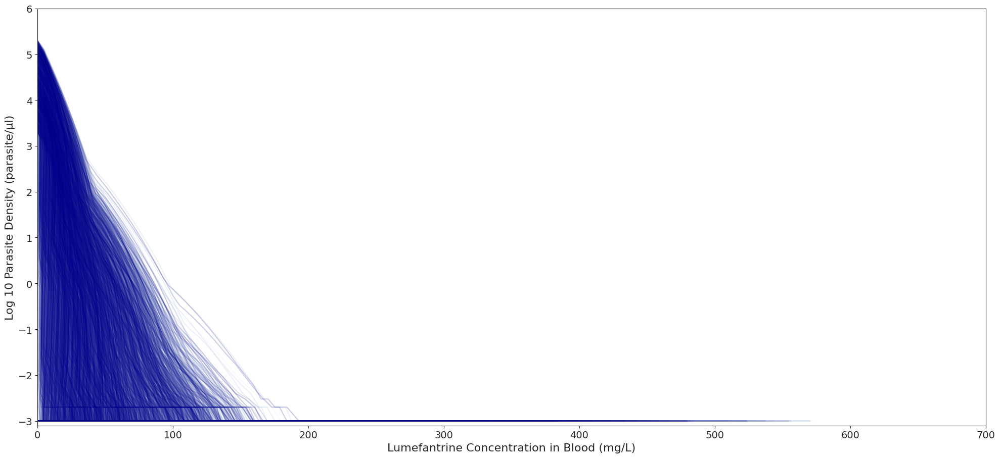

In [67]:
df_dict = {54: df_weight_compiled[0]}

fig, ax = plt.subplots(figsize=(20, 10), sharex=True) 

blue_cmap = LinearSegmentedColormap.from_list("blue_cmap", ["white", "lightsteelblue", "darkblue"])

weight = 54
df_weight = df_dict[weight]
num_pids = len(df_weight['PID'].unique())
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)

# Artemether Concentration
for j, pid in enumerate(df_weight['PID'].unique()):
    df_pid = df_weight[df_weight['PID'] == pid].copy()
    df_pid['LOG10_PARASITEDENSITY'] = np.log10(df_pid['PARASITEDENSITY'] + 0.001)
    color = blue_cmap(norm(j))
    ax.plot(df_pid['COMP2CONC_LUM'],df_pid['LOG10_PARASITEDENSITY'], color=color, alpha=0.25)
ax.set_xlim(0, 700)
ax.set_xticks(range(0, 701, 100))
ax.set_ylim(-3.1, 6)
ax.set_yticks(range(-3, 7, 1))
ax.set_xlabel('Lumefantrine Concentration in Blood (mg/L)', fontsize=16)
ax.set_ylabel('Log 10 Parasite Density (parasite/μl)', fontsize=16)


plt.tight_layout(rect=[0, 0.05, 1, 0.98])
#plt.savefig(f"df_weight_efficacy_{file_suffix}_72h.png")
plt.show()

In [8]:
#Converting to pandas DataFrame
df_weight_compiled_pandas = df_weight_compiled[0].copy()
df_weight_compiled_pandas['LOG10_PARASITEDENSITY'] = np.log10(df_weight_compiled_pandas['PARASITEDENSITY'] + 0.001)

df_weight_compiled_failed = df_weight_compiled_pandas[(df_weight_compiled_pandas['PARASITEDENSITY'] >= 10) & (df_weight_compiled_pandas['HOUR'] == 671.0)]
df_weight_compiled_failed_pids = df_weight_compiled_failed['PID'].unique().tolist()

#Assigning patients as failred/cleared based on day 28 parasite density
df_weight_compiled_pandas['STATUS'] = np.where(df_weight_compiled_pandas['PID'].isin(df_weight_compiled_failed_pids), 'Failed', 'Cleared')
df_weight_compiled_pandas

,PID,HOUR,COMP2CONC_ARTEMETHER,COMP2CONC_LUM,PARASITEDENSITY,LOG10_PARASITEDENSITY,STATUS
1,0,0.0,0.000,0.000,2954.000,3.470411,Cleared
2,0,1.0,14.935,4.419,1714.776,3.234208,Cleared
3,0,2.0,11.593,7.979,903.705,2.956027,Cleared
4,0,3.0,7.106,10.823,476.359,2.677935,Cleared
5,0,4.0,4.352,13.068,251.124,2.399890,Cleared
...,...,...,...,...,...,...,...
3359996,4999,667.0,0.000,0.548,0.000,-3.000000,Cleared
3359997,4999,668.0,0.000,0.545,0.000,-3.000000,Cleared
3359998,4999,669.0,0.000,0.543,0.000,-3.000000,Cleared
3359999,4999,670.0,0.000,0.541,0.000,-3.000000,Cleared


In [9]:
#Separating patients into failed and cleared
df_weight_compiled_cleared = df_weight_compiled_pandas[df_weight_compiled_pandas['STATUS'] == 'Cleared']
df_weight_compiled_failed = df_weight_compiled_pandas[df_weight_compiled_pandas['STATUS'] == 'Failed']

#Saving the cleared and failed dataframes to csv files
df_weight_compiled_cleared.to_csv(f'{file_suffix}_cleared.csv', index=False, quoting= False)
df_weight_compiled_failed.to_csv(f'{file_suffix}_failed.csv', index=False, quoting= False)

In [52]:
df_weight_compiled_cleared_wide = df_weight_compiled_cleared.pivot(index="HOUR", columns="PID", values="PARASITEDENSITY")
#df_weight_compiled_cleared_wide

df_weight_compiled_cleared_wide_log = df_weight_compiled_cleared.pivot(index="HOUR", columns="PID", values="LOG10_PARASITEDENSITY")
df_weight_compiled_cleared_wide_log

PID,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
HOUR,,,,,,,,,,,,,,,,,,,,,
0.0,3.470411,4.573661,3.519828,5.155606,4.920473,3.787815,4.872232,3.325516,4.947301,3.322426,...,4.004579,4.010173,4.967988,4.600210,4.951041,5.170045,3.899985,5.121612,4.205854,5.025175
1.0,3.234208,4.333822,3.265271,4.932082,4.692811,3.565056,4.655956,3.091194,4.740601,3.096474,...,3.750672,3.787865,4.752912,4.358798,4.695459,5.009514,3.678417,4.929290,4.039577,4.803159
2.0,2.956027,4.053718,2.987076,4.647658,4.410573,3.286666,4.373996,2.813066,4.457979,2.818344,...,3.472077,3.509218,4.470187,4.078583,4.413200,4.724239,3.399911,4.644896,3.760448,4.519995
3.0,2.677935,3.774554,2.708977,4.365759,4.130112,3.008461,4.093712,2.535002,4.177274,2.540278,...,3.193762,3.230875,4.189416,3.799355,4.132727,4.441751,3.121645,4.363017,3.481840,4.238939
4.0,2.399890,3.495926,2.430928,4.085512,3.850740,2.730357,3.814443,2.256973,3.897756,2.262249,...,2.915598,2.952696,3.909859,3.520691,3.853347,4.161132,2.843506,4.082782,3.203517,3.959210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667.0,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,...,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000
668.0,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,...,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000
669.0,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,...,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000


In [ ]:
# df_weight_compiled_failed_wide = df_weight_compiled_failed.pivot(index="HOUR", columns="PID", values="PARASITEDENSITY")
# #df_weight_compiled_failed_wide

# df_weight_compiled_failed_wide_log = df_weight_compiled_failed.pivot(index="HOUR", columns="PID", values="LOG10_PARASITEDENSITY")
# #df_weight_compiled_failed_wide_log

In [11]:
# Calculate the median, 25th percentile, and 75th percentile for cleared and failed
median_parasite_density_cleared = df_weight_compiled_cleared_wide.median(axis=1)
perc_05_parasite_density_cleared = df_weight_compiled_cleared_wide.quantile(0.05,axis=1)
perc_25_parasite_density_cleared = df_weight_compiled_cleared_wide.quantile(0.25,axis=1)
perc_75_parasite_density_cleared = df_weight_compiled_cleared_wide.quantile(0.75,axis=1)
perc_95_parasite_density_cleared = df_weight_compiled_cleared_wide.quantile(0.95,axis=1)


# median_parasite_density_failed = df_weight_compiled_failed_wide.median(axis=1)
# perc_25_parasite_density_failed = df_weight_compiled_failed_wide.quantile(0.25,axis=1)
# perc_75_parasite_density_failed = df_weight_compiled_failed_wide.quantile(0.75,axis=1)
# perc_05_parasite_density_failed = df_weight_compiled_failed_wide.quantile(0.05,axis=1)
# perc_95_parasite_density_failed = df_weight_compiled_failed_wide.quantile(0.95,axis=1)


# Calculate the median, 25th percentile, and 75th percentile for cleared and failed using log parasite density
median_parasite_density_cleared_log =  df_weight_compiled_cleared_wide_log.median(axis=1)
perc_25_parasite_density_cleared_log = df_weight_compiled_cleared_wide_log.quantile(0.25,axis=1)
perc_75_parasite_density_cleared_log = df_weight_compiled_cleared_wide_log.quantile(0.75,axis=1)
perc_05_parasite_density_cleared_log = df_weight_compiled_cleared_wide_log.quantile(0.05,axis=1)
perc_95_parasite_density_cleared_log = df_weight_compiled_cleared_wide_log.quantile(0.95,axis=1)

# median_parasite_density_failed_log = df_weight_compiled_failed_wide_log.median(axis=1)
# perc_25_parasite_density_failed_log = df_weight_compiled_failed_wide_log.quantile(0.25,axis=1)
# perc_75_parasite_density_failed_log = df_weight_compiled_failed_wide_log.quantile(0.75,axis=1)
# perc_05_parasite_density_failed_log = df_weight_compiled_failed_wide_log.quantile(0.05,axis=1)
# perc_95_parasite_density_failed_log = df_weight_compiled_failed_wide_log.quantile(0.95,axis=1)


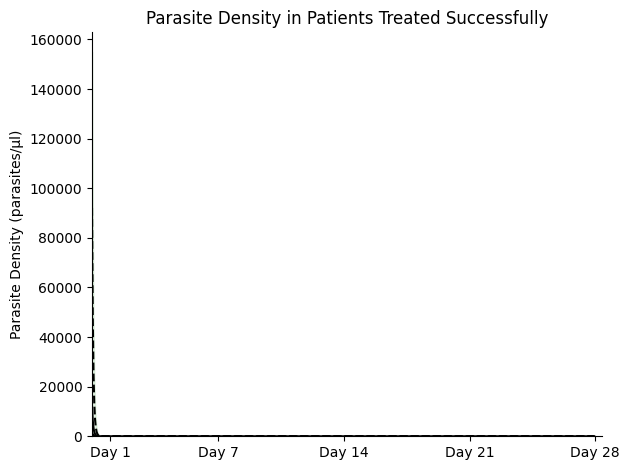

In [13]:
import seaborn as sns

# Create subplots
figsize=(16, 8)

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(x= df_weight_compiled_pandas['HOUR'], y= median_parasite_density_cleared, color="black")
sns.lineplot(x=df_weight_compiled_pandas['HOUR'], y=perc_05_parasite_density_cleared, color="black", linestyle='--')
sns.lineplot(x=df_weight_compiled_pandas['HOUR'], y=perc_95_parasite_density_cleared, color="black", linestyle='--')
ax1.fill_between(np.arange(672),perc_05_parasite_density_cleared, perc_95_parasite_density_cleared, color="#008400", alpha=0.1)

sns.despine(ax=ax1)


ax1.set_xlim(0, 680)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
ax1.set_ylim(0)
#Set x-axis label
ax1.set_xlabel('')
#Set y-axis label
ax1.set_ylabel('Parasite Density (parasites/μl)')

# Set tick positions and labels for specific days
tick_positions = [24.0,168.0, 336.0, 504.0,671.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['Day 1', 'Day 7', 'Day 14', 'Day 21','Day 28']
ax1.set_xticks(tick_positions)
ax1.set_xticklabels(tick_labels)

#Plot title
ax1.set_title('Parasite Density in Patients Treated Successfully')

plt.savefig(f'{file_suffix}_parasite_density.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

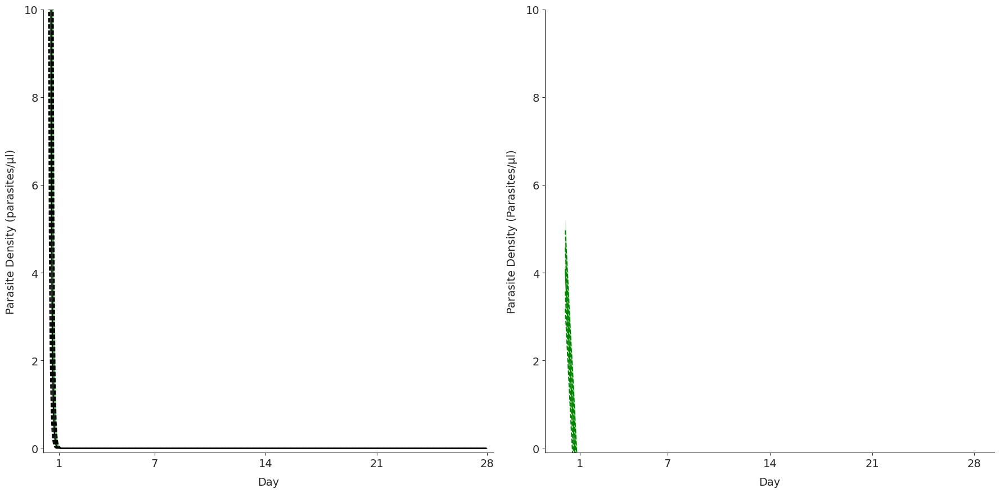

In [20]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, axes = plt.subplots(1, 2, figsize=(18, 9))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(ax=axes[0], x= df_weight_compiled_pandas['HOUR'], y= median_parasite_density_cleared, color="black")
sns.lineplot(ax=axes[0], x=df_weight_compiled_pandas['HOUR'], y=perc_05_parasite_density_cleared, color="black", linestyle='--')
sns.lineplot(ax=axes[0], x=df_weight_compiled_pandas['HOUR'], y=perc_25_parasite_density_cleared, color="black", linestyle='--')
sns.lineplot(ax=axes[0], x=df_weight_compiled_pandas['HOUR'], y=perc_75_parasite_density_cleared, color="black", linestyle='--')
sns.lineplot(ax=axes[0], x=df_weight_compiled_pandas['HOUR'], y=perc_95_parasite_density_cleared, color="black", linestyle='--')
axes[0].fill_between(np.arange(672),perc_25_parasite_density_cleared, perc_75_parasite_density_cleared, color="#008400", alpha=0.5)
axes[0].fill_between(np.arange(672),perc_05_parasite_density_cleared, perc_95_parasite_density_cleared, color="#008400", alpha=0.1)


sns.despine(ax=ax1)


ax1.set_xlim(0, 680)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
ax1.set_ylim(-0.1, 10)
#Set x-axis label
ax1.set_xlabel('Day', labelpad = 10)
#Set y-axis label
ax1.set_ylabel('Parasite Density (parasites/μl)', labelpad = 10)

# Set tick positions and labels for specific days
tick_positions = [24.0,168.0, 336.0, 504.0,671.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['1', '7', '14', '21','28']
ax1.set_xticks(tick_positions, tick_labels)

#Plot title
#ax1.set_title('Parasite Density in Patients Treated Successfully', fontsize = 10, pad = 20)

sns.set_style("ticks")

palette_cleared = ["#e5ffe5","#cbffcb","#b2ffb2","#98FF98","#7fff7f","#65ff65","#4cff4c"]
palette_failed = ["#ffcbcb","#ff9797","#ff6464","#ff3232","#ff0000","#cb0000","#970000"] 
#sns.lineplot(x='HOUR', y='LOG_PARASITEDENSITY', hue='PID', palette=sns.color_palette(palette_cleared, 83), data=df_100_patients_cleared, legend=False)
#sns.lineplot(x='HOUR', y='LOG_PARASITEDENSITY', hue='PID', palette=sns.color_palette(palette_failed, 17), data=df_100_patients_failed, legend=False)

ax2 = sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y= median_parasite_density_cleared_log, color="#008400")
sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y=perc_05_parasite_density_cleared_log, color="#008400", linestyle='--')
sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y=perc_25_parasite_density_cleared_log, color="#008400", linestyle='--')
sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y=perc_75_parasite_density_cleared_log, color="#008400", linestyle='--')
sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y=perc_95_parasite_density_cleared_log, color="#008400", linestyle='--')
axes[1].fill_between(np.arange(672),perc_05_parasite_density_cleared_log, perc_95_parasite_density_cleared_log, color="#008400", alpha=0.1)
axes[1].fill_between(np.arange(672),perc_25_parasite_density_cleared_log, perc_75_parasite_density_cleared_log, color="#008400", alpha=0.25)

sns.despine()

# Set tick positions and labels for specific days
ax2.set_ylim(-0.1, 10)
#Set x-axis label
ax2.set_xlabel('Day', labelpad = 10)
#Set y-axis label
ax2.set_ylabel('Parasite Density (parasites/μl)', labelpad = 10)
tick_positions = [24.0, 168.0, 336.0, 504.0,671.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['1', '7', '14', '21','28']
ax2.set_xticks(tick_positions, tick_labels)

ax2.set_xlabel('Day', labelpad = 10)
ax2.set_ylabel('Parasite Density (Parasites/μl)', labelpad = 10)
#ax2.set_title('Log10 Parasite Density in all Patients', fontsize = 10, pad = 20)

# Set common x-axis label
#fig.text(0.5, 0.04, 'Day', ha='center', va='center')

#Save plot
#plt.savefig('final_plots.svg', format='svg', )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

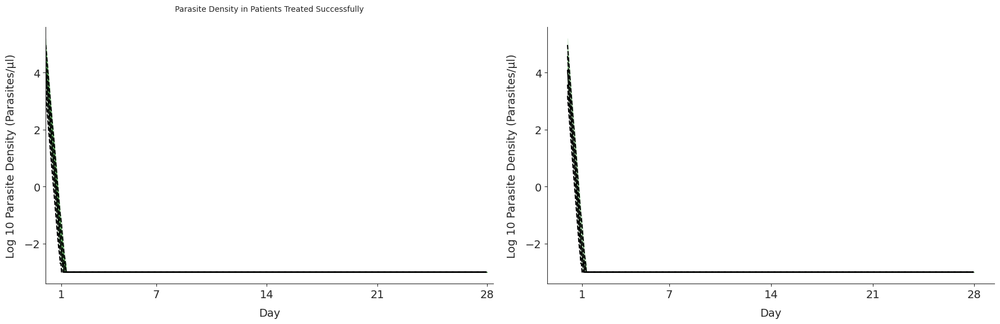

In [21]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(ax=axes[0], x= df_weight_compiled_pandas['HOUR'], y= median_parasite_density_cleared_log, color="black")
sns.lineplot(ax=axes[0], x=df_weight_compiled_pandas['HOUR'], y=perc_05_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=axes[0], x=df_weight_compiled_pandas['HOUR'], y=perc_25_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=axes[0], x=df_weight_compiled_pandas['HOUR'], y=perc_75_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=axes[0], x=df_weight_compiled_pandas['HOUR'], y=perc_95_parasite_density_cleared_log, color="black", linestyle='--')
axes[0].fill_between(np.arange(672),perc_25_parasite_density_cleared_log, perc_75_parasite_density_cleared_log, color="#008400", alpha=0.5)
axes[0].fill_between(np.arange(672),perc_05_parasite_density_cleared_log, perc_95_parasite_density_cleared_log, color="#008400", alpha=0.1)


sns.despine(ax=ax1)


ax1.set_xlim(0, 680)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
#ax1.set_ylim(-0.1, 10)
#Set x-axis label
ax1.set_xlabel('Day', labelpad = 10)
#Set y-axis label
ax1.set_ylabel('Log 10 Parasite Density (Parasites/μl)', labelpad = 10)

# Set tick positions and labels for specific days
tick_positions = [24.0,168.0, 336.0, 504.0,671.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['1', '7', '14', '21','28']
ax1.set_xticks(tick_positions, tick_labels)
#Plot title
ax1.set_title('Log 10 Parasite Density in Patients Treated Successfully', fontsize = 10, pad = 20)

palette_cleared = ["#e5ffe5","#cbffcb","#b2ffb2","#98FF98","#7fff7f","#65ff65","#4cff4c"]
palette_failed = ["#ffcbcb","#ff9797","#ff6464","#ff3232","#ff0000","#cb0000","#970000"] 
#sns.lineplot(x='HOUR', y='LOG_PARASITEDENSITY', hue='PID', palette=sns.color_palette(palette_cleared, 83), data=df_100_patients_cleared, legend=False)
#sns.lineplot(x='HOUR', y='LOG_PARASITEDENSITY', hue='PID', palette=sns.color_palette(palette_failed, 17), data=df_100_patients_failed, legend=False)

ax2 = sns.lineplot(ax = axes[1], x= df_weight_compiled_pandas['HOUR'], y= median_parasite_density_cleared_log, color="black")
sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y=perc_05_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y=perc_25_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y=perc_75_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax = axes[1], x=df_weight_compiled_pandas['HOUR'], y=perc_95_parasite_density_cleared_log, color="black", linestyle='--')
axes[1].fill_between(np.arange(672),perc_05_parasite_density_cleared_log, perc_95_parasite_density_cleared_log, color="#008400", alpha=0.1)
axes[1].fill_between(np.arange(672),perc_25_parasite_density_cleared_log, perc_75_parasite_density_cleared_log, color="#008400", alpha=0.25)

sns.despine()

# Set tick positions and labels for specific days
ax2.set_ylim(-0.1, 10)
#Set x-axis label
ax2.set_xlabel('Day', labelpad = 10)
#Set y-axis label
ax2.set_ylabel('Log 10 Parasite Density (Parasites/μl)', labelpad = 10)
tick_positions = [24.0, 168.0, 336.0, 504.0,671.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['1', '7', '14', '21','28']
ax2.set_xticks(tick_positions, tick_labels)

ax2.set_xlabel('Day', labelpad = 10)
ax2.set_ylabel('Log 10 Parasite Density (Parasites/μl)', labelpad = 10)
#ax2.set_title('Log10 Parasite Density in all Patients', fontsize = 10, pad = 20)

# Set common x-axis label
#fig.text(0.5, 0.04, 'Day', ha='center', va='center')

#Save plot
#plt.savefig('final_plots.svg', format='svg', )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

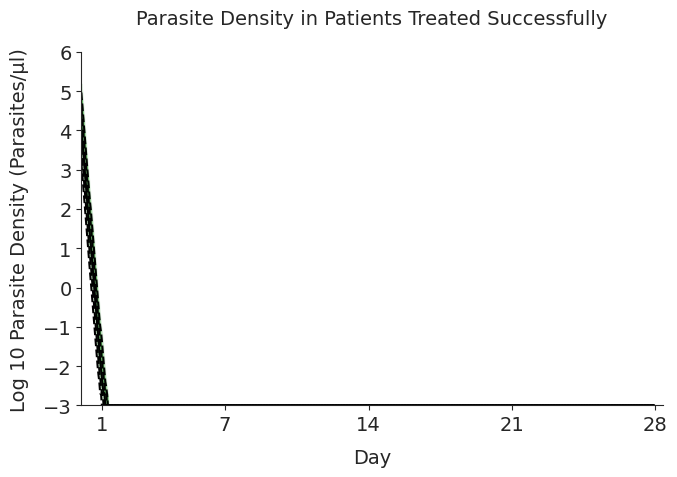

In [36]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=median_parasite_density_cleared_log, color="black")
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_05_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_25_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_75_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_95_parasite_density_cleared_log, color="black", linestyle='--')
ax.fill_between(np.arange(672), perc_25_parasite_density_cleared_log, perc_75_parasite_density_cleared_log, color="#008400", alpha=0.5)
ax.fill_between(np.arange(672), perc_05_parasite_density_cleared_log, perc_95_parasite_density_cleared_log, color="#008400", alpha=0.1)

sns.despine(ax=ax)

ax.set_xlim(0, 680)
ax.set_ylim(-3, 6)
# Set x-axis label
ax.set_xlabel('Day', labelpad=10)
# Set y-axis label
ax.set_ylabel('Log 10 Parasite Density (Parasites/μl)', labelpad=10)

# Set tick positions and labels for specific days
tick_positions = [24.0, 168.0, 336.0, 504.0, 671.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['1', '7', '14', '21', '28']
ax.set_xticks(tick_positions, tick_labels)

# Plot title
ax.set_title('Log 10 Parasite Density in Patients Treated Successfully', fontsize=14, pad=20)

# Save plot
plt.savefig(f'{file_suffix}_parasite_density_log_02.svg', format='svg')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

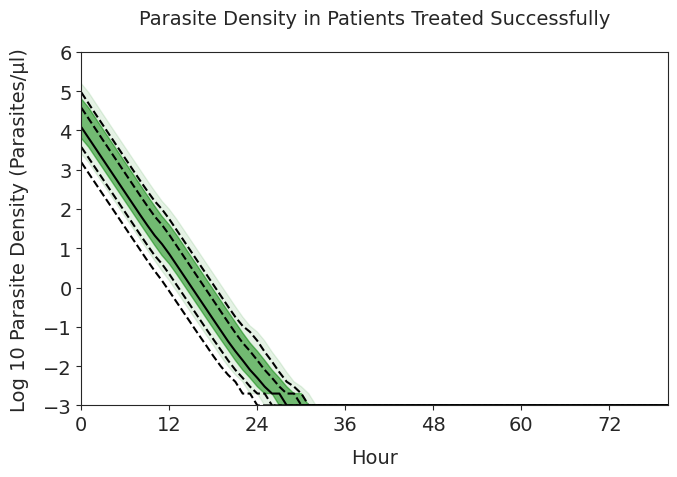

In [35]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax = sns.lineplot(ax=ax, x= df_weight_compiled_pandas['HOUR'], y= median_parasite_density_cleared_log, color="black")
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_05_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_25_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_75_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_95_parasite_density_cleared_log, color="black", linestyle='--')
ax.fill_between(np.arange(672),perc_25_parasite_density_cleared_log, perc_75_parasite_density_cleared_log, color="#008400", alpha=0.5)
ax.fill_between(np.arange(672),perc_05_parasite_density_cleared_log, perc_95_parasite_density_cleared_log, color="#008400", alpha=0.1)


sns.despine(ax=ax1)


ax.set_xlim(0, 80)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
ax.set_ylim(-3, 6)
#Set x-axis label
ax.set_xlabel('Hour', labelpad = 10)
#Set y-axis label
ax.set_ylabel('Log 10 Parasite Density (Parasites/μl)', labelpad = 10)

# Set tick positions and labels for specific days
tick_positions = [0, 12.0, 24.0, 36.0, 48.0, 60.0, 72.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['0', '12', '24', '36','48', '60', '72']
ax.set_xticks(tick_positions, tick_labels)
#Adding grid lines
# axes[0].grid(visible=True, which='major', color='black', linewidth=0.075)
# axes[0].grid(visible=True, which='minor', color='black', linewidth=0.075)
#Plot title
ax.set_title('Log 10 Parasite Density in Patients Treated Successfully', fontsize = 14, pad = 20)

# Save plot
plt.savefig(f'{file_suffix}_parasite_density_log_03.svg', format='svg', )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

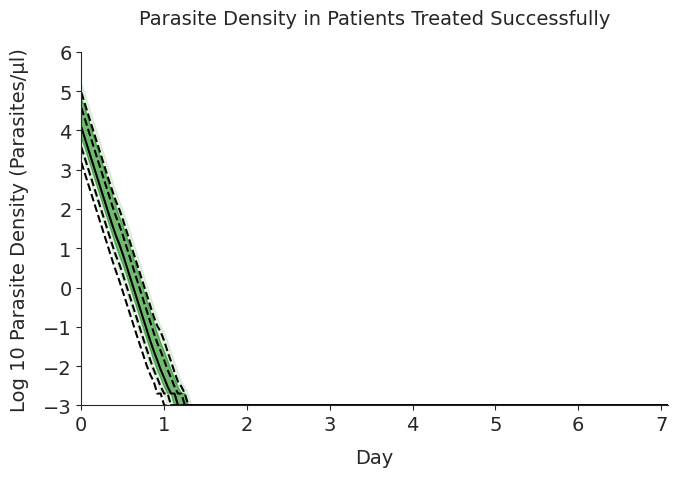

In [37]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(ax=ax, x= df_weight_compiled_pandas['HOUR'], y= median_parasite_density_cleared_log, color="black")
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_05_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_25_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_75_parasite_density_cleared_log, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_95_parasite_density_cleared_log, color="black", linestyle='--')
ax.fill_between(np.arange(672),perc_25_parasite_density_cleared_log, perc_75_parasite_density_cleared_log, color="#008400", alpha=0.5)
ax.fill_between(np.arange(672),perc_05_parasite_density_cleared_log, perc_95_parasite_density_cleared_log, color="#008400", alpha=0.1)


sns.despine(ax=ax1)


ax.set_xlim(0, 170)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
ax.set_ylim(-3, 6)
#Set x-axis label
ax.set_xlabel('Day', labelpad = 10)
#Set y-axis label
ax.set_ylabel('Log 10 Parasite Density (Parasites/μl)', labelpad = 10)

# Set tick positions and labels for specific days
tick_positions = [0, 24.0, 48.0, 72.0, 96.0, 120.0, 144.0, 168.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['0', '1', '2', '3','4', '5', '6', '7']
ax.set_xticks(tick_positions, tick_labels)
#Adding grid lines
# axes[0].grid(visible=True, which='major', color='black', linewidth=0.075)
# axes[0].grid(visible=True, which='minor', color='black', linewidth=0.075)
#Plot title
ax.set_title('Log 10 Parasite Density in Patients Treated Successfully', fontsize = 14, pad = 20)

# Save plot
plt.savefig(f'{file_suffix}_parasite_density_log_04.svg', format='svg', )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [38]:
df_weight_compiled_cleared_art_wide = df_weight_compiled_cleared.pivot(index="HOUR", columns="PID", values="COMP2CONC_ARTEMETHER")
#df_weight_compiled_cleared_art_wide

# df_weight_compiled_failed_art_wide = df_weight_compiled_failed.pivot(index="HOUR", columns="PID", values="COMP2CONC_ARTEMETHER")
# #df_weight_compiled_failed_art_wide

In [39]:
# Calculate the median, 25th percentile, and 75th percentile for cleared and failed
median_art_conc_cleared = df_weight_compiled_cleared_art_wide.median(axis=1)
perc_05_art_conc_cleared = df_weight_compiled_cleared_art_wide.quantile(0.05,axis=1)
perc_25_art_conc_cleared = df_weight_compiled_cleared_art_wide.quantile(0.25,axis=1)
perc_75_art_conc_cleared = df_weight_compiled_cleared_art_wide.quantile(0.75,axis=1)
perc_95_art_conc_cleared = df_weight_compiled_cleared_art_wide.quantile(0.95,axis=1)


# median_art_conc_failed = df_weight_compiled_failed_art_wide.median(axis=1)
# perc_25_art_conc_failed = df_weight_compiled_failed_art_wide.quantile(0.25,axis=1)
# perc_75_art_conc_failed = df_weight_compiled_failed_art_wide.quantile(0.75,axis=1)
# perc_05_art_conc_failed = df_weight_compiled_failed_art_wide.quantile(0.05,axis=1)
# perc_95_art_conc_failed = df_weight_compiled_failed_art_wide.quantile(0.95,axis=1)

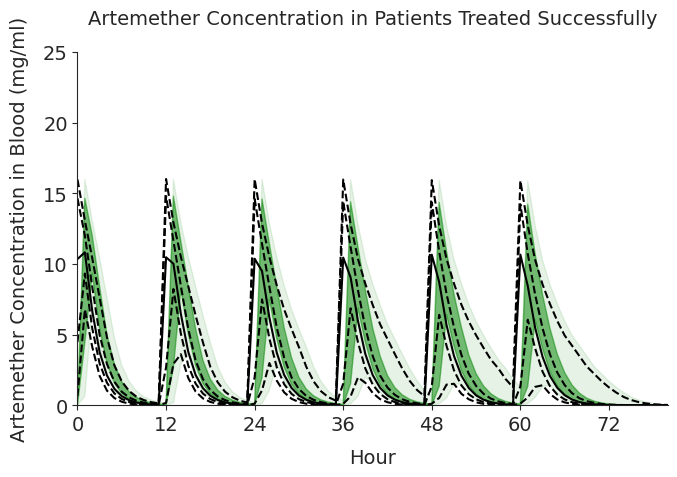

In [41]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(ax=ax, x= df_weight_compiled_pandas['HOUR'], y= median_art_conc_cleared, color="black")
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_05_art_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_25_art_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_75_art_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_95_art_conc_cleared, color="black", linestyle='--')
ax.fill_between(np.arange(672),perc_25_art_conc_cleared, perc_75_art_conc_cleared, color="#008400", alpha=0.5)
ax.fill_between(np.arange(672),perc_05_art_conc_cleared, perc_95_art_conc_cleared, color="#008400", alpha=0.1)


sns.despine(ax=ax)

ax.set_xlim(0, 80)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
ax.set_ylim(0, 25)
#Set x-axis label
ax.set_xlabel('Hour', labelpad = 10)
#Set y-axis label
ax.set_ylabel('Artemether Concentration in Blood (mg/ml)', labelpad = 10)

# Set tick positions and labels for specific days
tick_positions = [0, 12.0, 24.0, 36.0, 48.0, 60.0, 72.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['0', '12', '24', '36','48', '60', '72']
ax.set_xticks(tick_positions, tick_labels)
#Adding grid lines
# axes[0].grid(visible=True, which='major', color='black', linewidth=0.075)
# axes[0].grid(visible=True, which='minor', color='black', linewidth=0.075)
#Plot title
ax.set_title('Artemether Concentration in Patients Treated Successfully', fontsize = 14, pad = 20)

# Save plot
plt.savefig(f'{file_suffix}_artemether_conc_72h.svg', format='svg', )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [68]:
df_weight_compiled_cleared

,PID,HOUR,COMP2CONC_ARTEMETHER,COMP2CONC_LUM,PARASITEDENSITY,LOG10_PARASITEDENSITY,STATUS
1,0,0.0,0.000,0.000,2954.000,3.470411,Cleared
2,0,1.0,14.935,4.419,1714.776,3.234208,Cleared
3,0,2.0,11.593,7.979,903.705,2.956027,Cleared
4,0,3.0,7.106,10.823,476.359,2.677935,Cleared
5,0,4.0,4.352,13.068,251.124,2.399890,Cleared
...,...,...,...,...,...,...,...
3359996,4999,667.0,0.000,0.548,0.000,-3.000000,Cleared
3359997,4999,668.0,0.000,0.545,0.000,-3.000000,Cleared
3359998,4999,669.0,0.000,0.543,0.000,-3.000000,Cleared
3359999,4999,670.0,0.000,0.541,0.000,-3.000000,Cleared


In [42]:
df_weight_compiled_cleared_lum_wide = df_weight_compiled_cleared.pivot(index="HOUR", columns="PID", values="COMP2CONC_LUM")
#df_weight_compiled_cleared_lum_wide

# df_weight_compiled_failed_lum_wide = df_weight_compiled_failed.pivot(index="HOUR", columns="PID", values="COMP2CONC_LUM")
#df_weight_compiled_failed_lum_wide

In [43]:
# Calculate the median, 25th percentile, and 75th percentile for cleared and failed
median_lum_conc_cleared = df_weight_compiled_cleared_lum_wide.median(axis=1)
perc_05_lum_conc_cleared = df_weight_compiled_cleared_lum_wide.quantile(0.05,axis=1)
perc_25_lum_conc_cleared = df_weight_compiled_cleared_lum_wide.quantile(0.25,axis=1)
perc_75_lum_conc_cleared = df_weight_compiled_cleared_lum_wide.quantile(0.75,axis=1)
perc_95_lum_conc_cleared = df_weight_compiled_cleared_lum_wide.quantile(0.95,axis=1)


# median_lum_conc_failed = df_weight_compiled_failed_lum_wide.median(axis=1)
# perc_25_lum_conc_failed = df_weight_compiled_failed_lum_wide.quantile(0.25,axis=1)
# perc_75_lum_conc_failed = df_weight_compiled_failed_lum_wide.quantile(0.75,axis=1)
# perc_05_lum_conc_failed = df_weight_compiled_failed_lum_wide.quantile(0.05,axis=1)
# perc_95_lum_conc_failed = df_weight_compiled_failed_lum_wide.quantile(0.95,axis=1)

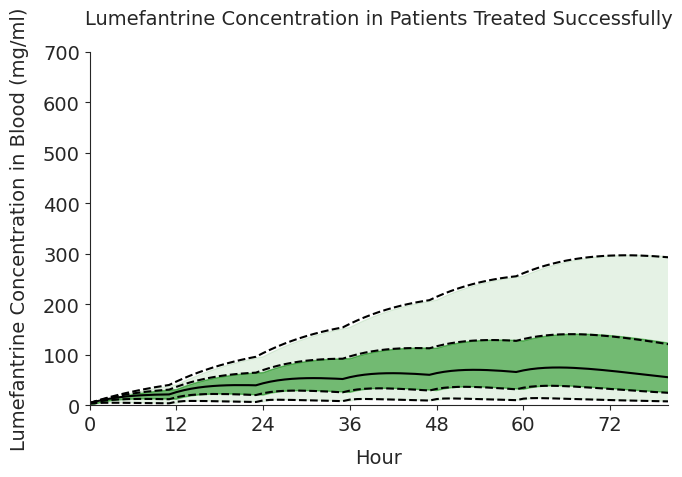

In [47]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(ax=ax, x= df_weight_compiled_pandas['HOUR'], y= median_lum_conc_cleared, color="black")
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_05_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_25_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_75_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_95_lum_conc_cleared, color="black", linestyle='--')
ax.fill_between(np.arange(672),perc_25_lum_conc_cleared, perc_75_lum_conc_cleared, color="#008400", alpha=0.5)
ax.fill_between(np.arange(672),perc_05_lum_conc_cleared, perc_95_lum_conc_cleared, color="#008400", alpha=0.1)


sns.despine(ax=ax)

ax.set_xlim(0, 80)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
ax.set_ylim(0, 700)
#Set x-axis label
ax.set_xlabel('Hour', labelpad = 10)
#Set y-axis label
ax.set_ylabel('Lumefantrine Concentration in Blood (mg/ml)', labelpad = 10)

# Set tick positions and labels for specific days
tick_positions = [0, 12.0, 24.0, 36.0, 48.0, 60.0, 72.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['0', '12', '24', '36','48', '60', '72']
ax.set_xticks(tick_positions, tick_labels)
#Plot title
ax.set_title('Lumefantrine Concentration in Patients Treated Successfully', fontsize = 14, pad = 20)

# Save plot
plt.savefig(f'{file_suffix}_lum_conc_72h.svg', format='svg', )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

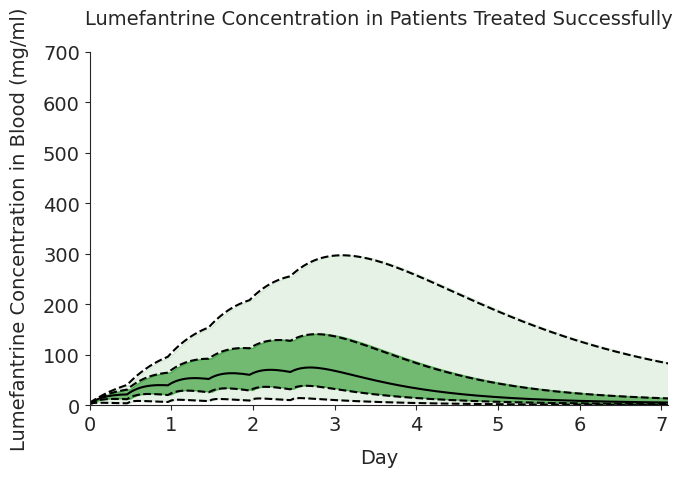

In [49]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(ax=ax, x= df_weight_compiled_pandas['HOUR'], y= median_lum_conc_cleared, color="black")
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_05_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_25_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_75_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_95_lum_conc_cleared, color="black", linestyle='--')
ax.fill_between(np.arange(672),perc_25_lum_conc_cleared, perc_75_lum_conc_cleared, color="#008400", alpha=0.5)
ax.fill_between(np.arange(672),perc_05_lum_conc_cleared, perc_95_lum_conc_cleared, color="#008400", alpha=0.1)


sns.despine(ax=ax1)


ax1.set_xlim(0, 170)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
ax1.set_ylim(0, 700)
#Set x-axis label
ax1.set_xlabel('Day', labelpad = 10)
#Set y-axis label
ax1.set_ylabel('Lumefantrine Concentration in Blood (mg/ml)', labelpad = 10)

# Set tick positions and labels for specific days
tick_positions = [0, 24.0, 48.0, 72.0, 96.0, 120.0, 144.0, 168.0]  # Day 0, Day 7, Day 14, Day 28 in hours
tick_labels = ['0', '1', '2', '3','4', '5', '6', '7']
ax1.set_xticks(tick_positions, tick_labels)
#Adding grid lines
# axes[0].grid(visible=True, which='major', color='black', linewidth=0.075)
# axes[0].grid(visible=True, which='minor', color='black', linewidth=0.075)
#Plot title
ax1.set_title('Lumefantrine Concentration in Patients Treated Successfully', fontsize = 14, pad = 20)

# Save plot
plt.savefig(f'{file_suffix}_lum_conc_7days.svg', format='svg', )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

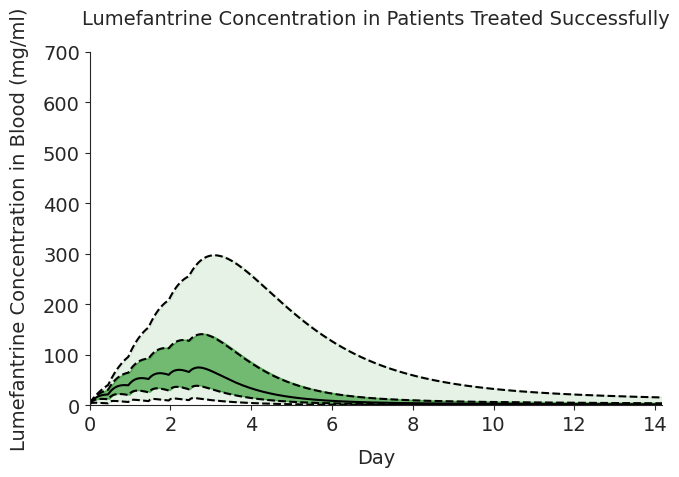

In [50]:
# Create subplots
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

ax1 = sns.lineplot(ax=ax, x= df_weight_compiled_pandas['HOUR'], y= median_lum_conc_cleared, color="black")
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_05_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_25_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_75_lum_conc_cleared, color="black", linestyle='--')
sns.lineplot(ax=ax, x=df_weight_compiled_pandas['HOUR'], y=perc_95_lum_conc_cleared, color="black", linestyle='--')
ax.fill_between(np.arange(672),perc_25_lum_conc_cleared, perc_75_lum_conc_cleared, color="#008400", alpha=0.5)
ax.fill_between(np.arange(672),perc_05_lum_conc_cleared, perc_95_lum_conc_cleared, color="#008400", alpha=0.1)


sns.despine(ax=ax1)


ax1.set_xlim(0, 340)
#ax1.set_yticks(range(0, int(df_100_patients['PARASITEDENSITY'].max()) + 100, 1000))
ax1.set_ylim(0, 700)
#Set x-axis label
ax1.set_xlabel('Day', labelpad = 10)
#Set y-axis label
ax1.set_ylabel('Lumefantrine Concentration in Blood (mg/ml)', labelpad = 10)

# Set tick positions and labels for specific days
tick_positions = [0, 48.0, 96.0, 144.0, 192.0, 240.0, 288.0, 336.0]  
tick_labels = ['0', '2', '4', '6','8', '10', '12', '14']
ax1.set_xticks(tick_positions, tick_labels)
#Adding grid lines
# axes[0].grid(visible=True, which='major', color='black', linewidth=0.075)
# axes[0].grid(visible=True, which='minor', color='black', linewidth=0.075)
#Plot title
ax1.set_title('Lumefantrine Concentration in Patients Treated Successfully', fontsize = 14, pad = 20)

# Save plot
plt.savefig(f'{file_suffix}_lum_conc_14days.svg', format='svg', )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

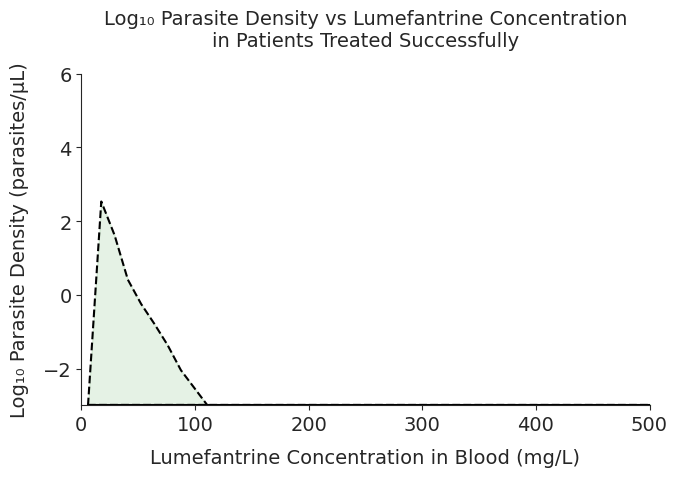

Concentration range analyzed: 5.84 - 566.68 mg/L
Number of concentration bins: 49
Median parasite density range: -3.00 - -3.00 log₁₀ parasites/μL


In [78]:
# Create lumefantrine concentration vs log10 parasite density plot with percentile bands
# Similar style to the time-based plot above
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

# Create binned data for lumefantrine concentration vs log10 parasite density
# First, we need to create bins for lumefantrine concentration
lum_conc_min = df_weight_compiled_cleared['COMP2CONC_LUM'].min()
lum_conc_max = df_weight_compiled_cleared['COMP2CONC_LUM'].max()
lum_bins = np.linspace(lum_conc_min, lum_conc_max, 50)  # 50 bins across the concentration range

# Calculate percentiles for each bin
bin_centers = []
median_parasite_log_by_lum = []
perc_05_parasite_log_by_lum = []
perc_25_parasite_log_by_lum = []
perc_75_parasite_log_by_lum = []
perc_95_parasite_log_by_lum = []

for i in range(len(lum_bins)-1):
    # Find data points in this concentration bin
    mask = (df_weight_compiled_cleared['COMP2CONC_LUM'] >= lum_bins[i]) & (df_weight_compiled_cleared['COMP2CONC_LUM'] < lum_bins[i+1])
    bin_data = df_weight_compiled_cleared[mask]
    
    if len(bin_data) > 5:  # Only include bins with sufficient data
        bin_centers.append((lum_bins[i] + lum_bins[i+1]) / 2)
        median_parasite_log_by_lum.append(bin_data['LOG10_PARASITEDENSITY'].median())
        perc_05_parasite_log_by_lum.append(bin_data['LOG10_PARASITEDENSITY'].quantile(0.05))
        perc_25_parasite_log_by_lum.append(bin_data['LOG10_PARASITEDENSITY'].quantile(0.25))
        perc_75_parasite_log_by_lum.append(bin_data['LOG10_PARASITEDENSITY'].quantile(0.75))
        perc_95_parasite_log_by_lum.append(bin_data['LOG10_PARASITEDENSITY'].quantile(0.95))

# Convert to numpy arrays for plotting
bin_centers = np.array(bin_centers)
median_parasite_log_by_lum = np.array(median_parasite_log_by_lum)
perc_05_parasite_log_by_lum = np.array(perc_05_parasite_log_by_lum)
perc_25_parasite_log_by_lum = np.array(perc_25_parasite_log_by_lum)
perc_75_parasite_log_by_lum = np.array(perc_75_parasite_log_by_lum)
perc_95_parasite_log_by_lum = np.array(perc_95_parasite_log_by_lum)

# Plot the lines
ax1 = sns.lineplot(ax=ax, x=bin_centers, y=median_parasite_log_by_lum, color="black")
sns.lineplot(ax=ax, x=bin_centers, y=perc_05_parasite_log_by_lum, color="black", linestyle='--')
sns.lineplot(ax=ax, x=bin_centers, y=perc_25_parasite_log_by_lum, color="black", linestyle='--')
sns.lineplot(ax=ax, x=bin_centers, y=perc_75_parasite_log_by_lum, color="black", linestyle='--')
sns.lineplot(ax=ax, x=bin_centers, y=perc_95_parasite_log_by_lum, color="black", linestyle='--')

# Fill between percentiles
ax.fill_between(bin_centers, perc_25_parasite_log_by_lum, perc_75_parasite_log_by_lum, color="#008400", alpha=0.5)
ax.fill_between(bin_centers, perc_05_parasite_log_by_lum, perc_95_parasite_log_by_lum, color="#008400", alpha=0.1)

sns.despine(ax=ax1)

# Set axis limits and labels
ax1.set_xlim(0, min(500, lum_conc_max))  # Limit to 500 mg/L or max, whichever is smaller
ax1.set_ylim(-3, 6)
ax1.set_xlabel('Lumefantrine Concentration in Blood (mg/L)', labelpad=10)
ax1.set_ylabel('Log₁₀ Parasite Density (parasites/μL)', labelpad=10)

# Set title
ax1.set_title('Log₁₀ Parasite Density vs Lumefantrine Concentration\nin Patients Treated Successfully', fontsize=14, pad=20)

# Save plot
plt.savefig(f'{file_suffix}_lum_conc_vs_log10_parasite_density.svg', format='svg')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

# Print some statistics about the relationship
print(f"Concentration range analyzed: {bin_centers.min():.2f} - {bin_centers.max():.2f} mg/L")
print(f"Number of concentration bins: {len(bin_centers)}")
print(f"Median parasite density range: {median_parasite_log_by_lum.min():.2f} - {median_parasite_log_by_lum.max():.2f} log₁₀ parasites/μL")

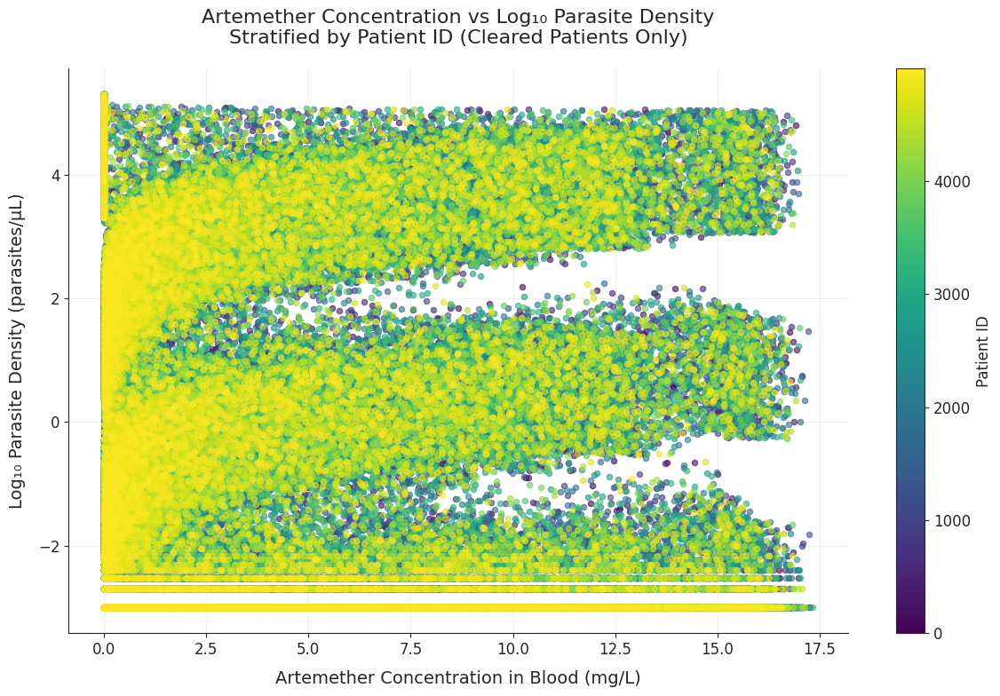

Number of unique patients (PIDs): 5000
Total number of data points: 3360000
Artemether concentration range: 0.000 - 17.323 mg/L
Log₁₀ parasite density range: -3.000 - 5.301


In [70]:
# Create scatter plot of artemether concentration vs log10 parasite density stratified by PID
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(12, 8))

# Get unique PIDs for color mapping
unique_pids = df_weight_compiled_cleared['PID'].unique()
num_pids = len(unique_pids)

# Create a colormap for different PIDs
colors = plt.cm.tab20(np.linspace(0, 1, min(num_pids, 20)))  # Use tab20 colormap for up to 20 PIDs
if num_pids > 20:
    colors = plt.cm.viridis(np.linspace(0, 1, num_pids))  # Use viridis for more PIDs

# Create scatter plot for each PID
for i, pid in enumerate(unique_pids):
    pid_data = df_weight_compiled_cleared[df_weight_compiled_cleared['PID'] == pid]
    color = colors[i % len(colors)]
    ax.scatter(pid_data['COMP2CONC_ARTEMETHER'], pid_data['LOG10_PARASITEDENSITY'], 
              color=color, alpha=0.6, s=20, label=f'PID {pid}')

# Set labels and title
ax.set_xlabel('Artemether Concentration in Blood (mg/L)', fontsize=14, labelpad=10)
ax.set_ylabel('Log₁₀ Parasite Density (parasites/μL)', fontsize=14, labelpad=10)
ax.set_title('Artemether Concentration vs Log₁₀ Parasite Density\nStratified by Patient ID (Cleared Patients Only)', 
             fontsize=16, pad=20)

# Add grid for better readability
ax.grid(True, alpha=0.3)

# Remove top and right spines
sns.despine()

# If there are too many PIDs, don't show individual legends
if num_pids <= 10:
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
else:
    # Add a colorbar instead of individual legends for many PIDs
    sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis if num_pids > 20 else plt.cm.tab20, 
                               norm=plt.Normalize(vmin=unique_pids.min(), vmax=unique_pids.max()))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, label='Patient ID')

# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig(f'{file_suffix}_artemether_vs_parasitedensity_by_pid.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{file_suffix}_artemether_vs_parasitedensity_by_pid.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

# Print some summary statistics
print(f"Number of unique patients (PIDs): {num_pids}")
print(f"Total number of data points: {len(df_weight_compiled_cleared)}")
print(f"Artemether concentration range: {df_weight_compiled_cleared['COMP2CONC_ARTEMETHER'].min():.3f} - {df_weight_compiled_cleared['COMP2CONC_ARTEMETHER'].max():.3f} mg/L")
print(f"Log₁₀ parasite density range: {df_weight_compiled_cleared['LOG10_PARASITEDENSITY'].min():.3f} - {df_weight_compiled_cleared['LOG10_PARASITEDENSITY'].max():.3f}")

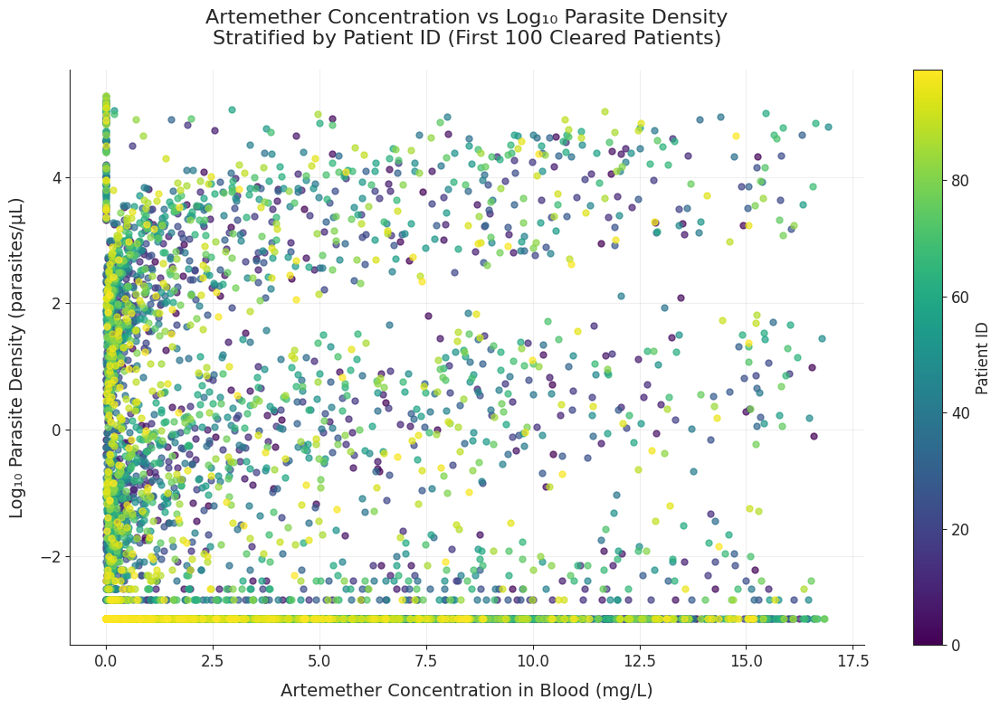

Number of patients (first 100 PIDs): 100
Total number of data points: 67200
PID range: 0 - 99
Artemether concentration range: -0.000 - 16.915 mg/L
Log₁₀ parasite density range: -3.000 - 5.289


In [71]:
# Create scatter plot of artemether concentration vs log10 parasite density for first 100 patients
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(12, 8))

# Filter data for first 100 patients
unique_pids_all = df_weight_compiled_cleared['PID'].unique()
first_100_pids = sorted(unique_pids_all)[:100]  # Get first 100 PIDs
df_first_100 = df_weight_compiled_cleared[df_weight_compiled_cleared['PID'].isin(first_100_pids)]

# Get unique PIDs for color mapping (now limited to 100)
unique_pids = df_first_100['PID'].unique()
num_pids = len(unique_pids)

# Create a colormap for different PIDs
colors = plt.cm.tab20(np.linspace(0, 1, min(num_pids, 20)))  # Use tab20 colormap for up to 20 PIDs
if num_pids > 20:
    colors = plt.cm.viridis(np.linspace(0, 1, num_pids))  # Use viridis for more PIDs

# Create scatter plot for each PID
for i, pid in enumerate(unique_pids):
    pid_data = df_first_100[df_first_100['PID'] == pid]
    color = colors[i % len(colors)]
    ax.scatter(pid_data['COMP2CONC_ARTEMETHER'], pid_data['LOG10_PARASITEDENSITY'], 
              color=color, alpha=0.7, s=25, label=f'PID {pid}')

# Set labels and title
ax.set_xlabel('Artemether Concentration in Blood (mg/L)', fontsize=14, labelpad=10)
ax.set_ylabel('Log₁₀ Parasite Density (parasites/μL)', fontsize=14, labelpad=10)
ax.set_title('Artemether Concentration vs Log₁₀ Parasite Density\nStratified by Patient ID (First 100 Cleared Patients)', 
             fontsize=16, pad=20)

# Add grid for better readability
ax.grid(True, alpha=0.3)

# Remove top and right spines
sns.despine()

# Since we have 100 patients, use colorbar instead of individual legends
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis if num_pids > 20 else plt.cm.tab20, 
                           norm=plt.Normalize(vmin=unique_pids.min(), vmax=unique_pids.max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, label='Patient ID')

# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig(f'{file_suffix}_artemether_vs_parasitedensity_first100_by_pid.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{file_suffix}_artemether_vs_parasitedensity_first100_by_pid.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

# Print some summary statistics for first 100 patients
print(f"Number of patients (first 100 PIDs): {num_pids}")
print(f"Total number of data points: {len(df_first_100)}")
print(f"PID range: {unique_pids.min()} - {unique_pids.max()}")
print(f"Artemether concentration range: {df_first_100['COMP2CONC_ARTEMETHER'].min():.3f} - {df_first_100['COMP2CONC_ARTEMETHER'].max():.3f} mg/L")
print(f"Log₁₀ parasite density range: {df_first_100['LOG10_PARASITEDENSITY'].min():.3f} - {df_first_100['LOG10_PARASITEDENSITY'].max():.3f}")

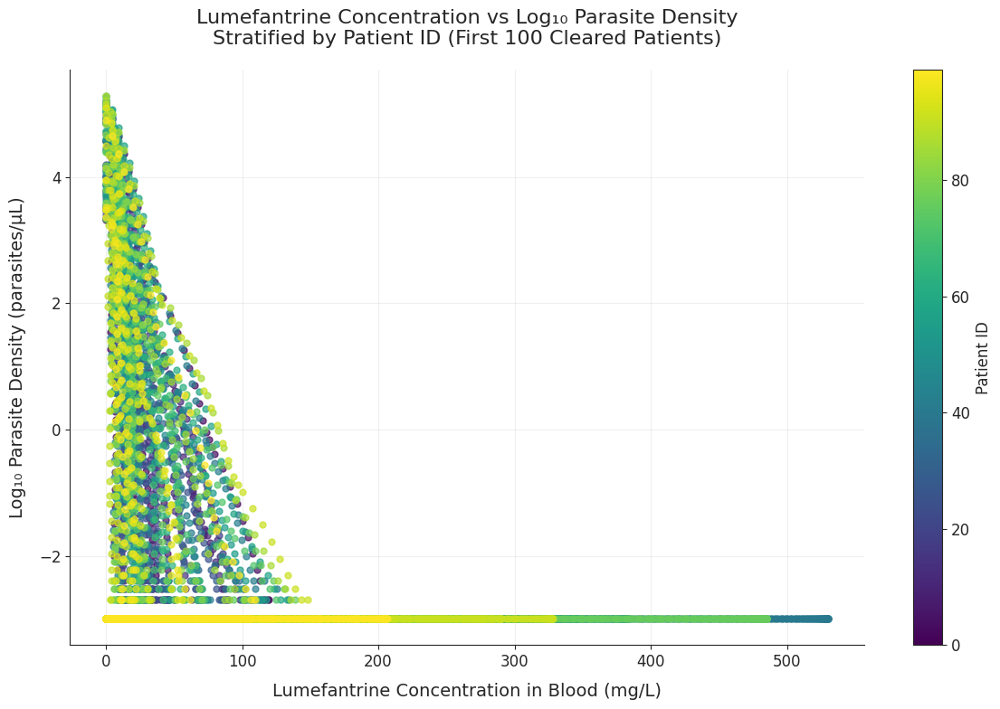

Number of patients (first 100 PIDs): 100
Total number of data points: 67200
PID range: 0 - 99
Lumefantrine concentration range: 0.000 - 530.035 mg/L
Log₁₀ parasite density range: -3.000 - 5.289


In [72]:
# Create scatter plot of lumefantrine concentration vs log10 parasite density for first 100 patients
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(12, 8))

# Filter data for first 100 patients (reuse from previous cell)
unique_pids_all = df_weight_compiled_cleared['PID'].unique()
first_100_pids = sorted(unique_pids_all)[:100]  # Get first 100 PIDs
df_first_100 = df_weight_compiled_cleared[df_weight_compiled_cleared['PID'].isin(first_100_pids)]

# Get unique PIDs for color mapping (now limited to 100)
unique_pids = df_first_100['PID'].unique()
num_pids = len(unique_pids)

# Create a colormap for different PIDs
colors = plt.cm.tab20(np.linspace(0, 1, min(num_pids, 20)))  # Use tab20 colormap for up to 20 PIDs
if num_pids > 20:
    colors = plt.cm.viridis(np.linspace(0, 1, num_pids))  # Use viridis for more PIDs

# Create scatter plot for each PID using LUMEFANTRINE concentration
for i, pid in enumerate(unique_pids):
    pid_data = df_first_100[df_first_100['PID'] == pid]
    color = colors[i % len(colors)]
    ax.scatter(pid_data['COMP2CONC_LUM'], pid_data['LOG10_PARASITEDENSITY'], 
              color=color, alpha=0.7, s=25, label=f'PID {pid}')

# Set labels and title
ax.set_xlabel('Lumefantrine Concentration in Blood (mg/L)', fontsize=14, labelpad=10)
ax.set_ylabel('Log₁₀ Parasite Density (parasites/μL)', fontsize=14, labelpad=10)
ax.set_title('Lumefantrine Concentration vs Log₁₀ Parasite Density\nStratified by Patient ID (First 100 Cleared Patients)', 
             fontsize=16, pad=20)

# Add grid for better readability
ax.grid(True, alpha=0.3)

# Remove top and right spines
sns.despine()

# Since we have 100 patients, use colorbar instead of individual legends
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis if num_pids > 20 else plt.cm.tab20, 
                           norm=plt.Normalize(vmin=unique_pids.min(), vmax=unique_pids.max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, label='Patient ID')

# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig(f'{file_suffix}_lumefantrine_vs_parasitedensity_first100_by_pid.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{file_suffix}_lumefantrine_vs_parasitedensity_first100_by_pid.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

# Print some summary statistics for first 100 patients with lumefantrine
print(f"Number of patients (first 100 PIDs): {num_pids}")
print(f"Total number of data points: {len(df_first_100)}")
print(f"PID range: {unique_pids.min()} - {unique_pids.max()}")
print(f"Lumefantrine concentration range: {df_first_100['COMP2CONC_LUM'].min():.3f} - {df_first_100['COMP2CONC_LUM'].max():.3f} mg/L")
print(f"Log₁₀ parasite density range: {df_first_100['LOG10_PARASITEDENSITY'].min():.3f} - {df_first_100['LOG10_PARASITEDENSITY'].max():.3f}")

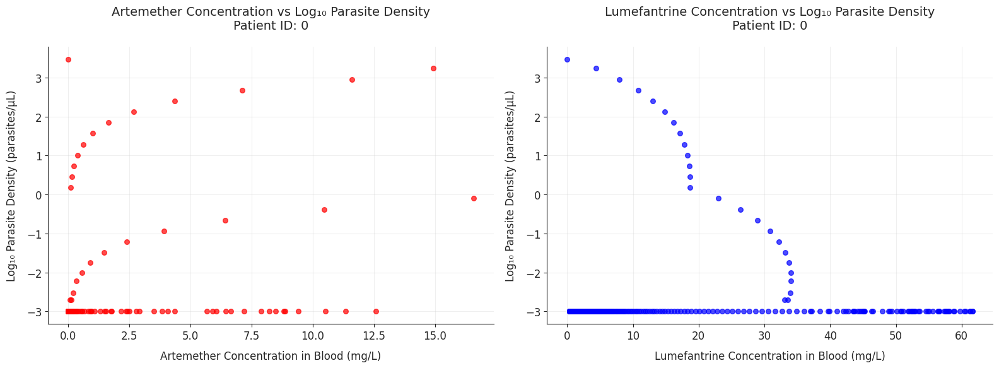

Selected Patient ID: 0
Number of data points for this patient: 672
Time range: 0.0 - 671.0 hours
Artemether concentration range: 0.000 - 16.582 mg/L
Lumefantrine concentration range: 0.000 - 61.635 mg/L
Log₁₀ parasite density range: -3.000 - 3.470
Final parasite density: 0.000 parasites/μL


In [73]:
# Create plots for both artemether and lumefantrine concentrations vs log10 parasite density for ONE patient
plt.rcParams.update({'font.size': 12})

# Select one patient (let's use the first patient, PID 0)
selected_pid = 0
single_patient_data = df_weight_compiled_cleared[df_weight_compiled_cleared['PID'] == selected_pid]

# Create subplots - side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Artemether concentration vs log10 parasite density
ax1.scatter(single_patient_data['COMP2CONC_ARTEMETHER'], single_patient_data['LOG10_PARASITEDENSITY'], 
           color='red', alpha=0.7, s=30)

ax1.set_xlabel('Artemether Concentration in Blood (mg/L)', fontsize=12, labelpad=10)
ax1.set_ylabel('Log₁₀ Parasite Density (parasites/μL)', fontsize=12, labelpad=10)
ax1.set_title(f'Artemether Concentration vs Log₁₀ Parasite Density\nPatient ID: {selected_pid}', 
             fontsize=14, pad=20)
ax1.grid(True, alpha=0.3)

# Plot 2: Lumefantrine concentration vs log10 parasite density
ax2.scatter(single_patient_data['COMP2CONC_LUM'], single_patient_data['LOG10_PARASITEDENSITY'], 
           color='blue', alpha=0.7, s=30)

ax2.set_xlabel('Lumefantrine Concentration in Blood (mg/L)', fontsize=12, labelpad=10)
ax2.set_ylabel('Log₁₀ Parasite Density (parasites/μL)', fontsize=12, labelpad=10)
ax2.set_title(f'Lumefantrine Concentration vs Log₁₀ Parasite Density\nPatient ID: {selected_pid}', 
             fontsize=14, pad=20)
ax2.grid(True, alpha=0.3)

# Remove top and right spines for both plots
sns.despine(ax=ax1)
sns.despine(ax=ax2)

# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig(f'{file_suffix}_single_patient_{selected_pid}_both_drugs_vs_parasitedensity.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{file_suffix}_single_patient_{selected_pid}_both_drugs_vs_parasitedensity.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

# Print summary statistics for the single patient
print(f"Selected Patient ID: {selected_pid}")
print(f"Number of data points for this patient: {len(single_patient_data)}")
print(f"Time range: {single_patient_data['HOUR'].min():.1f} - {single_patient_data['HOUR'].max():.1f} hours")
print(f"Artemether concentration range: {single_patient_data['COMP2CONC_ARTEMETHER'].min():.3f} - {single_patient_data['COMP2CONC_ARTEMETHER'].max():.3f} mg/L")
print(f"Lumefantrine concentration range: {single_patient_data['COMP2CONC_LUM'].min():.3f} - {single_patient_data['COMP2CONC_LUM'].max():.3f} mg/L")
print(f"Log₁₀ parasite density range: {single_patient_data['LOG10_PARASITEDENSITY'].min():.3f} - {single_patient_data['LOG10_PARASITEDENSITY'].max():.3f}")
print(f"Final parasite density: {single_patient_data[single_patient_data['HOUR'] == single_patient_data['HOUR'].max()]['PARASITEDENSITY'].values[0]:.3f} parasites/μL")

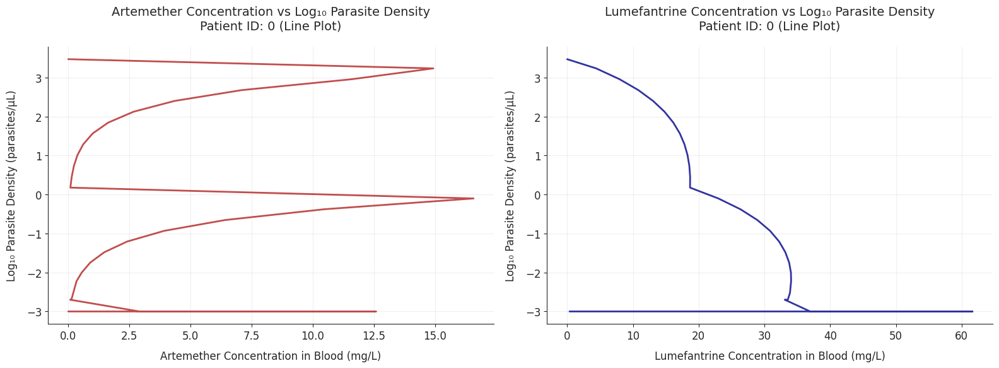

Line Plot Version - Selected Patient ID: 0
Number of data points for this patient: 672
Time range: 0.0 - 671.0 hours
Artemether concentration range: 0.000 - 16.582 mg/L
Lumefantrine concentration range: 0.000 - 61.635 mg/L
Log₁₀ parasite density range: -3.000 - 3.470
Final parasite density: 0.000 parasites/μL


In [74]:
# Create LINE plots for both artemether and lumefantrine concentrations vs log10 parasite density for ONE patient
# Using specified color maps
plt.rcParams.update({'font.size': 12})

# Define custom color maps as specified
red_cmap = LinearSegmentedColormap.from_list("red_cmap", ["white", "lightcoral", "firebrick"])
blue_cmap = LinearSegmentedColormap.from_list("blue_cmap", ["white", "lightsteelblue", "darkblue"])

# Select one patient (let's use the first patient, PID 0)
selected_pid = 0
single_patient_data = df_weight_compiled_cleared[df_weight_compiled_cleared['PID'] == selected_pid].copy()

# Sort by time for proper line plotting
single_patient_data = single_patient_data.sort_values('HOUR')

# Create subplots - side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Artemether concentration vs log10 parasite density (LINE PLOT)
ax1.plot(single_patient_data['COMP2CONC_ARTEMETHER'], single_patient_data['LOG10_PARASITEDENSITY'], 
         color='firebrick', linewidth=2, alpha=0.8)

ax1.set_xlabel('Artemether Concentration in Blood (mg/L)', fontsize=12, labelpad=10)
ax1.set_ylabel('Log₁₀ Parasite Density (parasites/μL)', fontsize=12, labelpad=10)
ax1.set_title(f'Artemether Concentration vs Log₁₀ Parasite Density\nPatient ID: {selected_pid} (Line Plot)', 
             fontsize=14, pad=20)
ax1.grid(True, alpha=0.3)

# Plot 2: Lumefantrine concentration vs log10 parasite density (LINE PLOT)
ax2.plot(single_patient_data['COMP2CONC_LUM'], single_patient_data['LOG10_PARASITEDENSITY'], 
         color='darkblue', linewidth=2, alpha=0.8)

ax2.set_xlabel('Lumefantrine Concentration in Blood (mg/L)', fontsize=12, labelpad=10)
ax2.set_ylabel('Log₁₀ Parasite Density (parasites/μL)', fontsize=12, labelpad=10)
ax2.set_title(f'Lumefantrine Concentration vs Log₁₀ Parasite Density\nPatient ID: {selected_pid} (Line Plot)', 
             fontsize=14, pad=20)
ax2.grid(True, alpha=0.3)

# Remove top and right spines for both plots
sns.despine(ax=ax1)
sns.despine(ax=ax2)

# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig(f'{file_suffix}_single_patient_{selected_pid}_both_drugs_vs_parasitedensity_lineplot.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{file_suffix}_single_patient_{selected_pid}_both_drugs_vs_parasitedensity_lineplot.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

# Print summary statistics for the line plot version
print(f"Line Plot Version - Selected Patient ID: {selected_pid}")
print(f"Number of data points for this patient: {len(single_patient_data)}")
print(f"Time range: {single_patient_data['HOUR'].min():.1f} - {single_patient_data['HOUR'].max():.1f} hours")
print(f"Artemether concentration range: {single_patient_data['COMP2CONC_ARTEMETHER'].min():.3f} - {single_patient_data['COMP2CONC_ARTEMETHER'].max():.3f} mg/L")
print(f"Lumefantrine concentration range: {single_patient_data['COMP2CONC_LUM'].min():.3f} - {single_patient_data['COMP2CONC_LUM'].max():.3f} mg/L")
print(f"Log₁₀ parasite density range: {single_patient_data['LOG10_PARASITEDENSITY'].min():.3f} - {single_patient_data['LOG10_PARASITEDENSITY'].max():.3f}")
print(f"Final parasite density: {single_patient_data[single_patient_data['HOUR'] == single_patient_data['HOUR'].max()]['PARASITEDENSITY'].values[0]:.3f} parasites/μL")

Selected random PIDs: [np.int64(912), np.int64(204), np.int64(2253), np.int64(2006), np.int64(1828)]


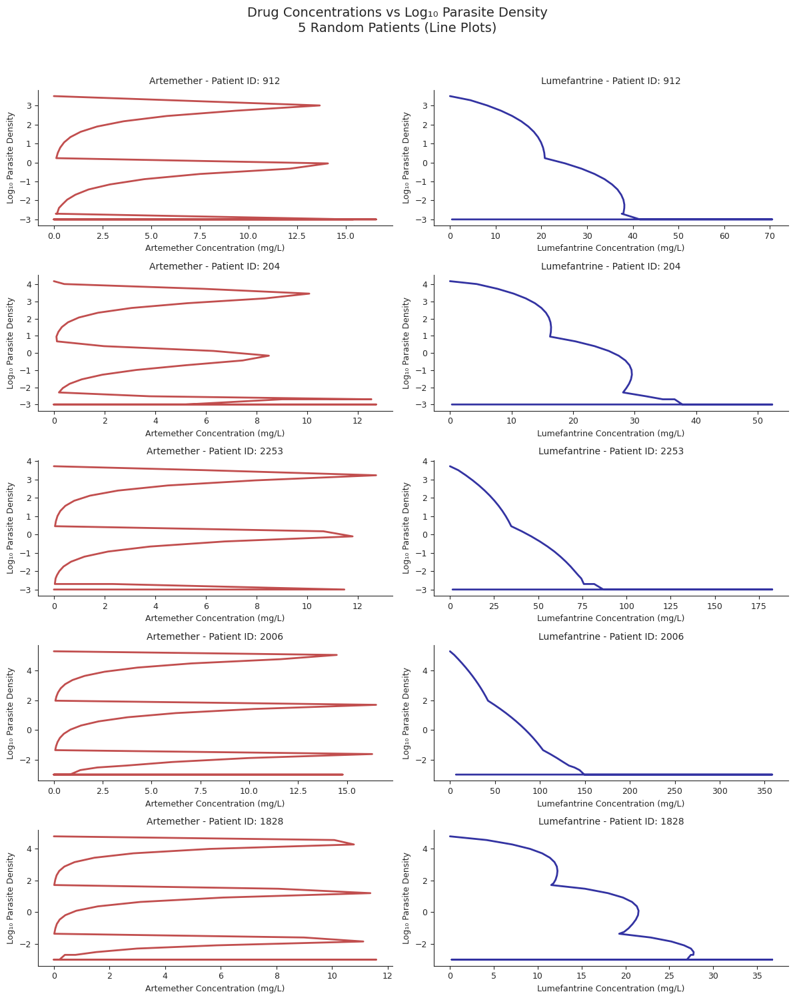


=== Summary Statistics for 5 Random Patients ===
Patient ID 912:
  - Data points: 672
  - Artemether range: -0.000 - 16.557 mg/L
  - Lumefantrine range: 0.000 - 70.505 mg/L
  - Log₁₀ parasite density range: -3.000 - 3.504
  - Final parasite density: 0.000 parasites/μL

Patient ID 204:
  - Data points: 672
  - Artemether range: 0.000 - 12.723 mg/L
  - Lumefantrine range: 0.000 - 52.377 mg/L
  - Log₁₀ parasite density range: -3.000 - 4.178
  - Final parasite density: 0.000 parasites/μL

Patient ID 2253:
  - Data points: 672
  - Artemether range: 0.000 - 12.725 mg/L
  - Lumefantrine range: 0.000 - 182.565 mg/L
  - Log₁₀ parasite density range: -3.000 - 3.729
  - Final parasite density: 0.000 parasites/μL

Patient ID 2006:
  - Data points: 672
  - Artemether range: 0.000 - 16.494 mg/L
  - Lumefantrine range: 0.000 - 358.456 mg/L
  - Log₁₀ parasite density range: -3.000 - 5.292
  - Final parasite density: 0.000 parasites/μL

Patient ID 1828:
  - Data points: 672
  - Artemether range: 0.000

In [77]:
# Create 5x2 LINE plots for both artemether and lumefantrine concentrations vs log10 parasite density for 5 RANDOM patients
# Using specified color maps - COMPACT VERSION (no gridlines)
plt.rcParams.update({'font.size': 9})

# Define custom color maps as specified
red_cmap = LinearSegmentedColormap.from_list("red_cmap", ["white", "lightcoral", "firebrick"])
blue_cmap = LinearSegmentedColormap.from_list("blue_cmap", ["white", "lightsteelblue", "darkblue"])

# Select 5 random patients from cleared patients
import random
all_pids = df_weight_compiled_cleared['PID'].unique()
random.seed(42)  # Set seed for reproducibility
selected_pids = random.sample(list(all_pids), 5)
print(f"Selected random PIDs: {selected_pids}")

# Create 5x2 subplots (5 rows, 2 columns) - More compact
fig, axes = plt.subplots(5, 2, figsize=(12, 15))

# Loop through each selected patient
for i, pid in enumerate(selected_pids):
    # Get data for this patient
    patient_data = df_weight_compiled_cleared[df_weight_compiled_cleared['PID'] == pid].copy()
    patient_data = patient_data.sort_values('HOUR')  # Sort by time for proper line plotting
    
    # Left column: Artemether concentration vs log10 parasite density
    axes[i, 0].plot(patient_data['COMP2CONC_ARTEMETHER'], patient_data['LOG10_PARASITEDENSITY'], 
                    color='firebrick', linewidth=2, alpha=0.8)
    axes[i, 0].set_xlabel('Artemether Concentration (mg/L)', fontsize=9)
    axes[i, 0].set_ylabel('Log₁₀ Parasite Density', fontsize=9)
    axes[i, 0].set_title(f'Artemether - Patient ID: {pid}', fontsize=10)
    
    # Right column: Lumefantrine concentration vs log10 parasite density
    axes[i, 1].plot(patient_data['COMP2CONC_LUM'], patient_data['LOG10_PARASITEDENSITY'], 
                    color='darkblue', linewidth=2, alpha=0.8)
    axes[i, 1].set_xlabel('Lumefantrine Concentration (mg/L)', fontsize=9)
    axes[i, 1].set_ylabel('Log₁₀ Parasite Density', fontsize=9)
    axes[i, 1].set_title(f'Lumefantrine - Patient ID: {pid}', fontsize=10)
    
    # Remove top and right spines for both plots
    sns.despine(ax=axes[i, 0])
    sns.despine(ax=axes[i, 1])

# Add overall title
fig.suptitle('Drug Concentrations vs Log₁₀ Parasite Density\n5 Random Patients (Line Plots)', 
             fontsize=14, y=0.995)

# Adjust layout - more compact spacing
plt.tight_layout(rect=[0, 0, 1, 0.97])

# Save the plot
plt.savefig(f'{file_suffix}_5_random_patients_both_drugs_vs_parasitedensity_lineplot_compact.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{file_suffix}_5_random_patients_both_drugs_vs_parasitedensity_lineplot_compact.svg', format='svg', bbox_inches='tight')

# Show the plot
plt.show()

# Print summary statistics for each patient
print("\n=== Summary Statistics for 5 Random Patients ===")
for pid in selected_pids:
    patient_data = df_weight_compiled_cleared[df_weight_compiled_cleared['PID'] == pid]
    final_parasites = patient_data[patient_data['HOUR'] == patient_data['HOUR'].max()]['PARASITEDENSITY'].values[0]
    print(f"Patient ID {pid}:")
    print(f"  - Data points: {len(patient_data)}")
    print(f"  - Artemether range: {patient_data['COMP2CONC_ARTEMETHER'].min():.3f} - {patient_data['COMP2CONC_ARTEMETHER'].max():.3f} mg/L")
    print(f"  - Lumefantrine range: {patient_data['COMP2CONC_LUM'].min():.3f} - {patient_data['COMP2CONC_LUM'].max():.3f} mg/L")
    print(f"  - Log₁₀ parasite density range: {patient_data['LOG10_PARASITEDENSITY'].min():.3f} - {patient_data['LOG10_PARASITEDENSITY'].max():.3f}")
    print(f"  - Final parasite density: {final_parasites:.3f} parasites/μL")
    print()

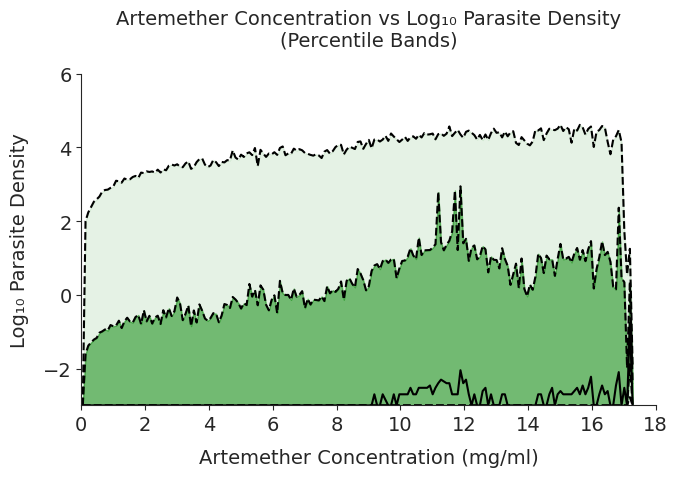

In [105]:
# Percentile band plot for Artemether concentration vs log10 parasite density
# Similar to the time-based plot but plotting against parasite density instead

# Define artemether concentration bins
art_conc_min = df_weight_compiled_cleared['COMP2CONC_ARTEMETHER'].min()
art_conc_max = df_weight_compiled_cleared['COMP2CONC_ARTEMETHER'].max()
#art_conc_max = 41
art_bins = np.linspace(art_conc_min, art_conc_max, 200)  # 100 bins

# Calculate percentiles for each bin
median_parasite_log_by_art = []
perc_05_parasite_log_by_art = []
perc_25_parasite_log_by_art = []
perc_75_parasite_log_by_art = []
perc_95_parasite_log_by_art = []

for i in range(len(art_bins) - 1):
    mask = (df_weight_compiled_cleared['COMP2CONC_ARTEMETHER'] >= art_bins[i]) & \
           (df_weight_compiled_cleared['COMP2CONC_ARTEMETHER'] < art_bins[i + 1])
    
    if mask.sum() > 0:  # Only calculate if there are data points in this bin
        parasite_data = df_weight_compiled_cleared[mask]['LOG10_PARASITEDENSITY']
        median_parasite_log_by_art.append(parasite_data.median())
        perc_05_parasite_log_by_art.append(parasite_data.quantile(0.05))
        perc_25_parasite_log_by_art.append(parasite_data.quantile(0.25))
        perc_75_parasite_log_by_art.append(parasite_data.quantile(0.75))
        perc_95_parasite_log_by_art.append(parasite_data.quantile(0.95))
    else:
        # If no data points, append NaN
        median_parasite_log_by_art.append(np.nan)
        perc_05_parasite_log_by_art.append(np.nan)
        perc_25_parasite_log_by_art.append(np.nan)
        perc_75_parasite_log_by_art.append(np.nan)
        perc_95_parasite_log_by_art.append(np.nan)

# Convert to numpy arrays for plotting
median_parasite_log_by_art = np.array(median_parasite_log_by_art)
perc_05_parasite_log_by_art = np.array(perc_05_parasite_log_by_art)
perc_25_parasite_log_by_art = np.array(perc_25_parasite_log_by_art)
perc_75_parasite_log_by_art = np.array(perc_75_parasite_log_by_art)
perc_95_parasite_log_by_art = np.array(perc_95_parasite_log_by_art)

# Calculate bin centers for x-axis
art_bin_centers = (art_bins[:-1] + art_bins[1:]) / 2

# Create subplots
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=(7, 5))

colors = ["#B22222", "#98FF98"]
sns.set_palette(sns.color_palette(colors))

# Plot percentile lines (matching the style from your reference plot)
ax1 = sns.lineplot(ax=ax, x=art_bin_centers, y=median_parasite_log_by_art, color="black")
sns.lineplot(ax=ax, x=art_bin_centers, y=perc_05_parasite_log_by_art, color="black", linestyle='--')
sns.lineplot(ax=ax, x=art_bin_centers, y=perc_25_parasite_log_by_art, color="black", linestyle='--')
sns.lineplot(ax=ax, x=art_bin_centers, y=perc_75_parasite_log_by_art, color="black", linestyle='--')
sns.lineplot(ax=ax, x=art_bin_centers, y=perc_95_parasite_log_by_art, color="black", linestyle='--')

# Fill between percentiles (matching the green color scheme)
ax.fill_between(art_bin_centers, perc_25_parasite_log_by_art, perc_75_parasite_log_by_art, color="#008400", alpha=0.5)
ax.fill_between(art_bin_centers, perc_05_parasite_log_by_art, perc_95_parasite_log_by_art, color="#008400", alpha=0.1)

sns.despine(ax=ax)

# Set axis limits and labels
ax.set_xlim(art_conc_min, 18)
ax.set_ylim(-3, 6)  # Adjusted y-limits to match the reference plot

# Set x-axis label
ax.set_xlabel('Artemether Concentration (mg/ml)', labelpad=10)
# Set y-axis label  
ax.set_ylabel('Log₁₀ Parasite Density', labelpad=10)

# Plot title
ax.set_title('Artemether Concentration vs Log₁₀ Parasite Density\n(Percentile Bands)', fontsize=14, pad=20)

# Save plot
plt.savefig(f'{file_suffix}_artemether_conc_vs_parasite_density_percentiles.svg', format='svg')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()